In [1]:
import numpy as np
import pandas as pd
from keras.applications.mobilenet import MobileNet, preprocess_input
from tensorflow.keras.applications.mobilenet_v2 import MobileNetV2
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dropout, Dense,BatchNormalization, Flatten, MaxPool2D
from keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau, Callback
from keras.layers import Conv2D, Reshape
import tensorflow as tf
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from tensorflow.keras.layers import GlobalAveragePooling2D
from tensorflow.keras.optimizers import Adam
from tensorflow.python.keras.preprocessing.image import ImageDataGenerator
import cv2
import os

In [2]:
real = "../input/real-and-fake-face-detection/real_and_fake_face/training_real/"
fake = "../input/real-and-fake-face-detection/real_and_fake_face/training_fake/"

real_path = os.listdir(real)
fake_path = os.listdir(fake)

In [3]:
def load_img(path):
    image = cv2.imread(path)
    image = cv2.resize(image,(224, 224))
    return image[...,::-1]

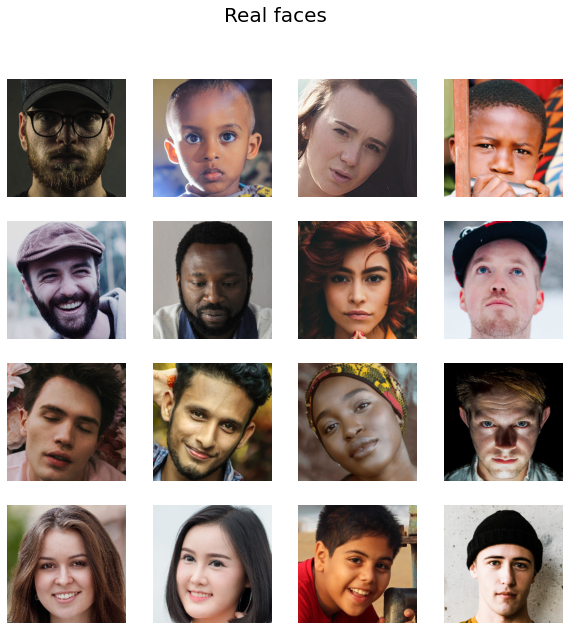

In [4]:
fig = plt.figure(figsize=(10, 10))

for i in range(16):
    plt.subplot(4, 4, i+1)
    plt.imshow(load_img(real + real_path[i]), cmap='gray')
    plt.suptitle("Real faces",fontsize=20)
    plt.axis('off')

plt.show()

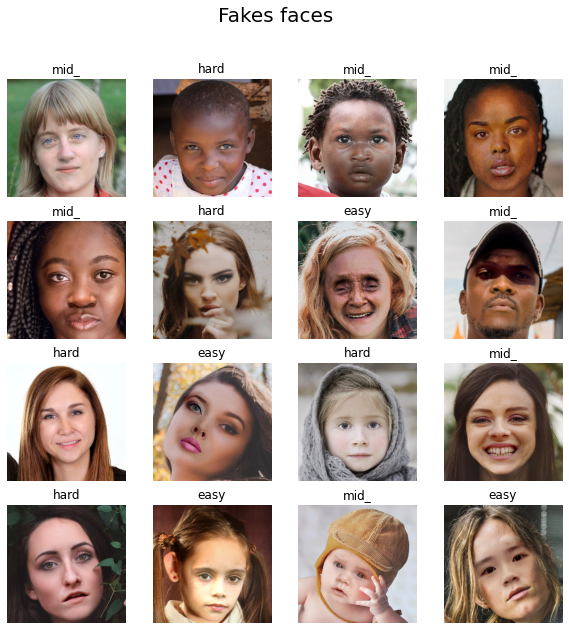

In [5]:
fig = plt.figure(figsize=(10,10))

for i in range(16):
    plt.subplot(4, 4, i+1)
    plt.imshow(load_img(fake + fake_path[i]), cmap='gray')
    plt.suptitle("Fakes faces",fontsize=20)
    plt.title(fake_path[i][:4])
    plt.axis('off')

plt.show()

In [6]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

In [7]:
img = cv2.imread('../input/real-and-fake-face-detection/real_and_fake_face/training_real/real_00007.jpg')

In [8]:
image = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

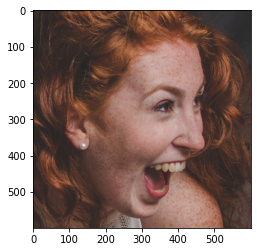

In [9]:
plt.imshow(image)

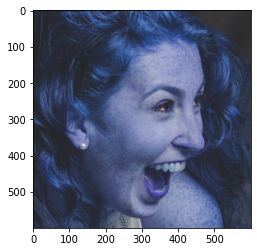

In [10]:
plt.imshow(img)

# Histogram Equalization

> #### this method usually increases the global contrast of many images, especially when the image is represented by a narrow range of intensity values. 
> #### Through this adjustment the intensities can be better distributed on the histogram utilizing the full range of intensities evenly. This allows for areas of lower local contrast to gain a higher contrast. Histogram equalization accomplishes this by effectively spreading out the highly populated intensity values which are used to degrade image contrast.

In [11]:
child= cv2.imread('../input/real-and-fake-face-detection/real_and_fake_face/training_real/real_00034.jpg',0)

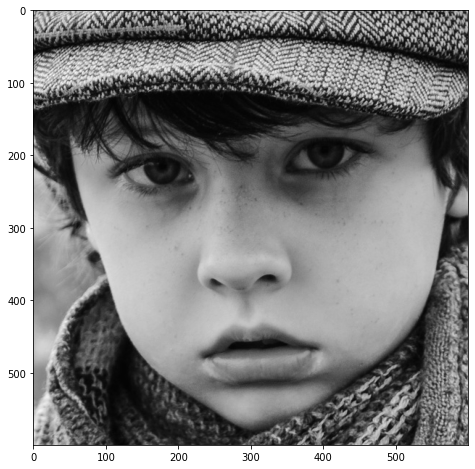

In [12]:
def display(img,cmap=None):
    fig = plt.figure(figsize=(10,8))
    ax = fig.add_subplot(111)
    ax.imshow(img,cmap)
display(child,cmap='gray')

In [13]:
childd = cv2.equalizeHist(child)

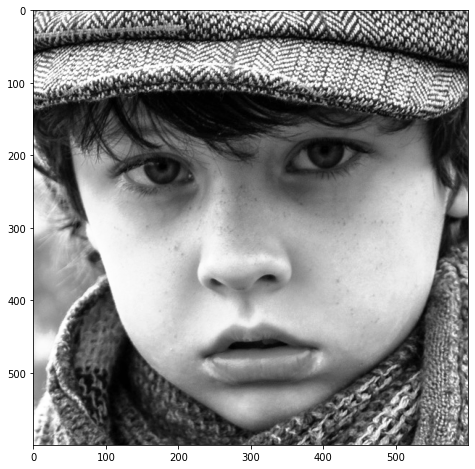

In [14]:
display(childd,cmap='gray')

#### the black percentage in the photo = the white percentage 

## Color Images

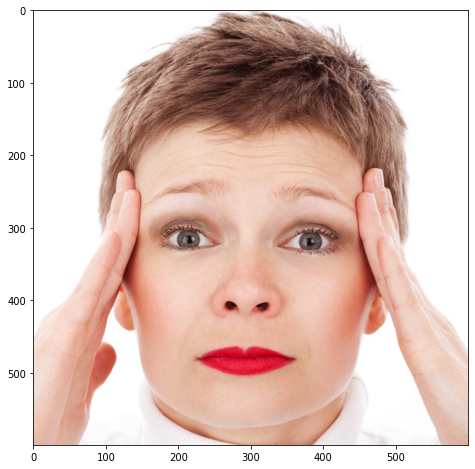

In [15]:
color_ph = cv2.imread('../input/real-and-fake-face-detection/real_and_fake_face/training_real/real_00002.jpg')
show_ph = cv2.cvtColor(color_ph,cv2.COLOR_BGR2RGB)
hsv = cv2.cvtColor(color_ph, cv2.COLOR_BGR2HSV)
display(show_ph)

In [16]:
hsv[:,:,2] = cv2.equalizeHist(hsv[:,:,2])

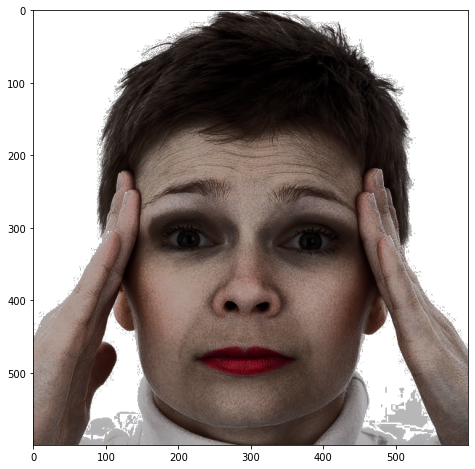

In [17]:
eq_color_woman = cv2.cvtColor(hsv, cv2.COLOR_HSV2RGB)
display(eq_color_woman)

# Colorspaces

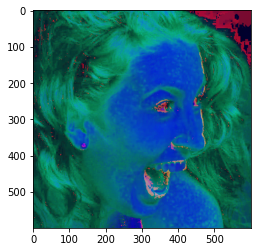

In [18]:
img = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
plt.imshow(img)

In [19]:
def display_img(img):
    fig = plt.figure(figsize=(12,10))
    ax = fig.add_subplot(111)
    ax.imshow(img)

### Gamma Correction : Practical Effect of Increasing Brightness

> #### Your monitor’s gamma tells you its pixels’ luminance at every brightness level, from 0-100%. Lower gamma makes shadows looks brighter and can result in a flatter, washed out image, where it's harder to see brighter highlights. Higher gamma can make it harder to see details in shadows 

>#### Gamma is important because it affects the appearance of dark areas, like blacks and shadows and midtones, as well as highlights. Monitors with poor gamma can either crush detail at various points or wash it out, making the entire picture appear flat and dull. Proper gamma leads to more depth and realism and a more three-dimensional image.

## the image with poor gamma

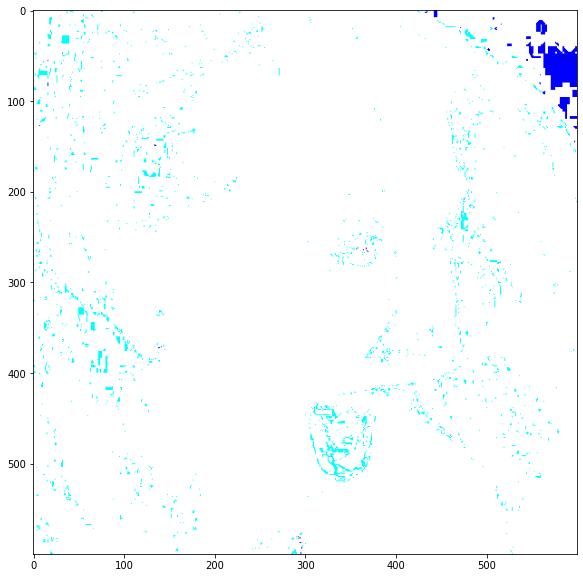

In [20]:
gamma = 1/4
effected_image = np.power(img, gamma)
display_img(effected_image)

#### image with a bit higher gamma but still not suitable enough

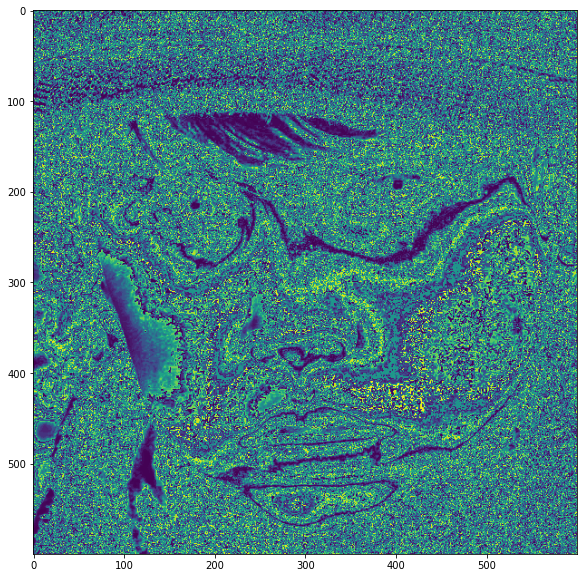

In [21]:
gamma = 2
effected_image = np.power(childd, gamma)
display_img(effected_image)

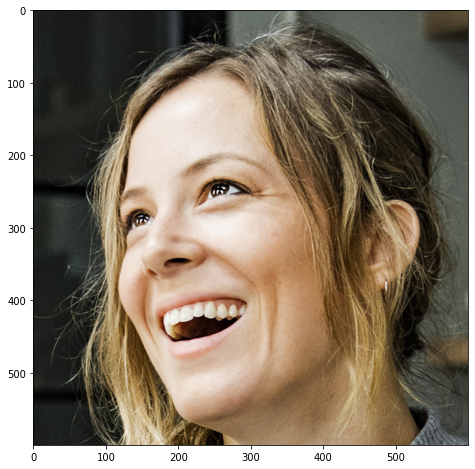

In [22]:
blonde= cv2.imread('../input/real-and-fake-face-detection/real_and_fake_face/training_real/real_00003.jpg')
blondee = cv2.cvtColor(blonde, cv2.COLOR_BGR2RGB)
display(blondee)

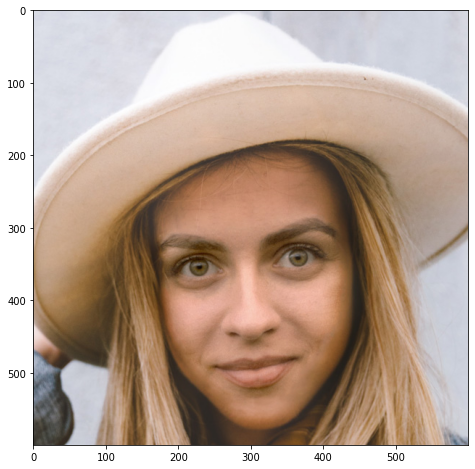

In [23]:
hat= cv2.imread('../input/real-and-fake-face-detection/real_and_fake_face/training_fake/hard_100_1111.jpg')
hatt = cv2.cvtColor(hat, cv2.COLOR_BGR2RGB)
display(hatt)

### Low Pass Filter with a 2D Convolution


#### The most basic of filtering operations is called "low-pass" 
A low-pass filter, also called a "blurring" or "smoothing" filter, averages out rapid changes in intensity. The simplest low-pass filter just calculates the average of a pixel and all of its eight immediate neighbors. The result replaces the original value of the pixel. The process is repeated for every pixel in the image.



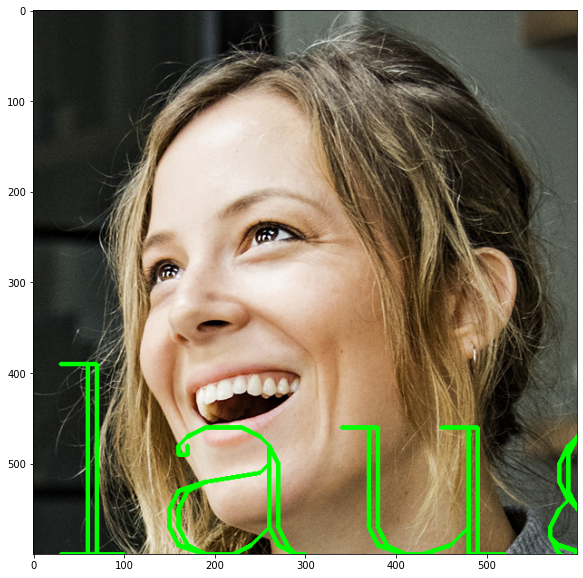

In [24]:
font = cv2.FONT_HERSHEY_COMPLEX
cv2.putText(blondee,text='laugh',org=(10,600), fontFace=font,fontScale= 10,color=(0,255,0),thickness=4)
display_img(blondee)

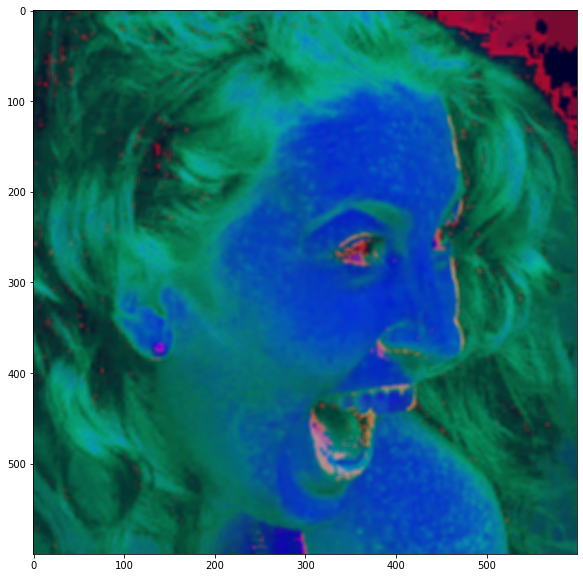

In [25]:
kernel = np.ones(shape=(5,5),dtype=np.float32)/25
dst = cv2.filter2D(img,-1,kernel)
display_img(dst)

## Averaging

> #### Average (or mean) filtering is a method of ‘smoothing’ images by 
reducing the amount of intensity variation between neighbouring
pixels.
The average filter works by moving through the image pixel by pixel,
replacing each value with the average value of neighbouring pixels,
including itself.
There are some potential problems:
>#### A single pixel with a very unrepresentative value can significantly
affect the average value of all the pixels in its neighbourhood.
>#### When the filter neighbourhood straddles an edge, the filter will
interpolate new values for pixels on the edge and so will blur that
edge. This may be a problem if sharp edges are required in the
output.

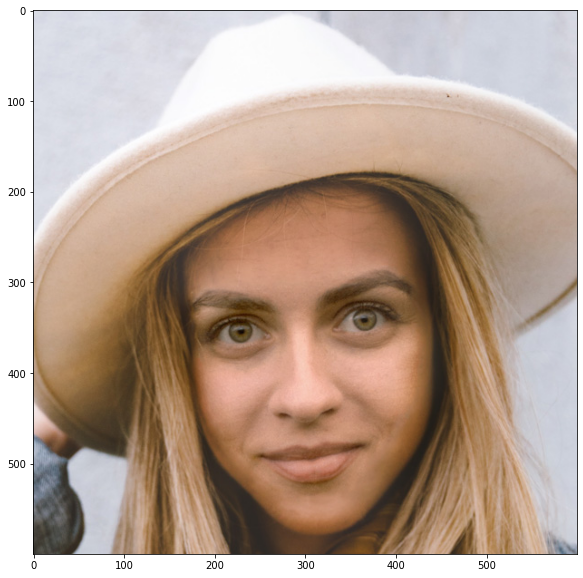

In [26]:
font = cv2.FONT_HERSHEY_COMPLEX
display_img(hatt)

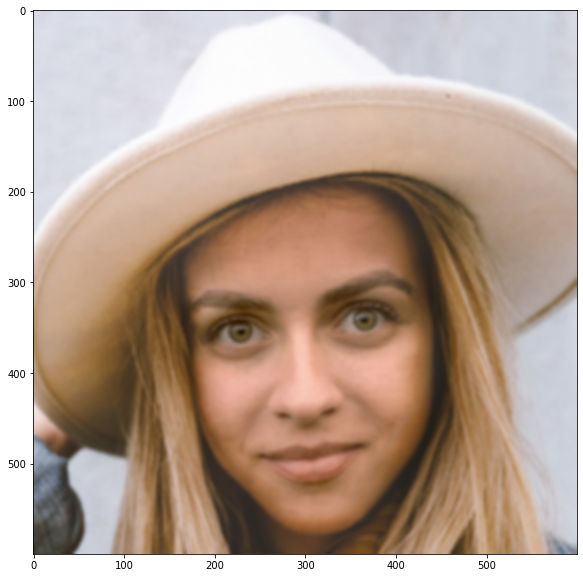

In [27]:
blurred_img = cv2.blur(hatt,ksize=(5,5))
display_img(blurred_img)

#### as we see the Averaging filter made quite good smoothing and blurring

## Gaussian Blurring

> ### the “Gaussian” blur filter calculates the mean of the neighboring pixels

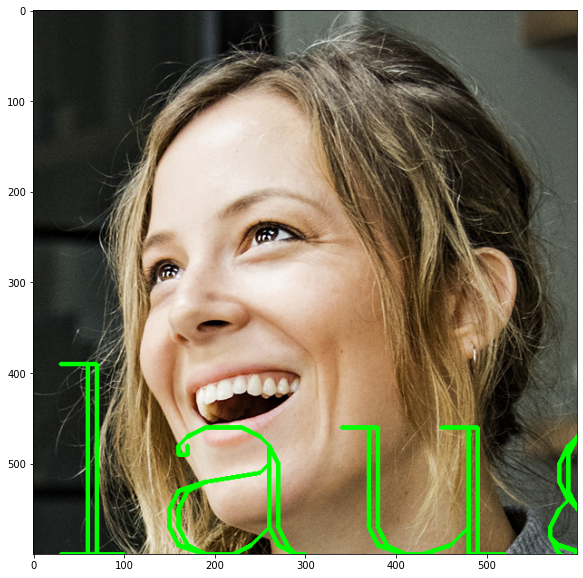

In [28]:
font = cv2.FONT_HERSHEY_COMPLEX
display_img(blondee)

## Median Blurring

> #### the “Median” blur filter calculates the median,
>#### This calculation does not create a new value,and an unrepresentative pixel in the neighborhood will not affect the result. So, the filter preserves edges and rounds corners. It is used to reduce noise, especially salt and pepper noise, and delete scratches on photographs.

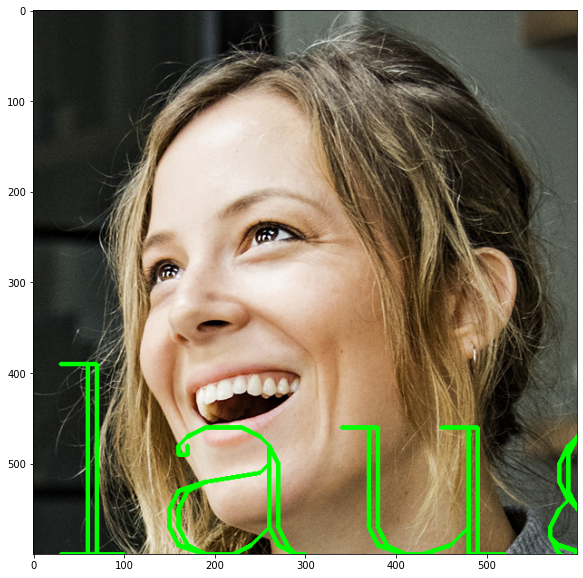

In [29]:
font = cv2.FONT_HERSHEY_COMPLEX
display_img(blondee)

## Gaussian vs Median

> ### The radius of the neighborhood. Increasing radius increases blur. Contrary to the “Gaussian” filter, edges are not blurred. Corners are rounded and convex surfaces are eroded.

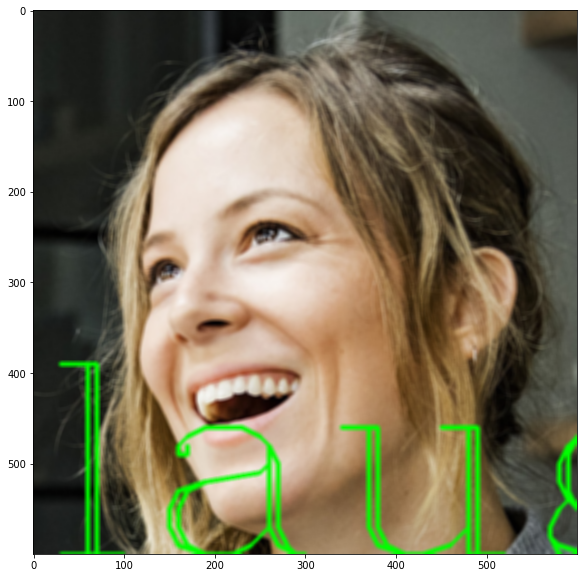

In [30]:
blurred_img = cv2.GaussianBlur(blondee,(5,5),10)
display_img(blurred_img)

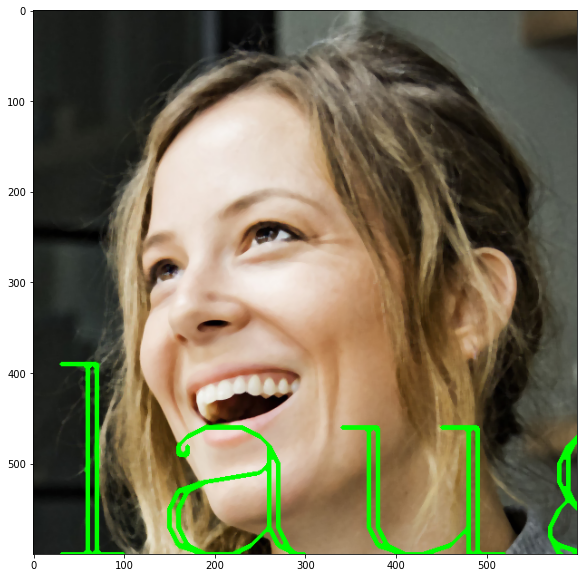

In [31]:
median = cv2.medianBlur(blondee,5)
display_img(median)

#### as we see the blurring is more effective using gaussian than the meadian

## Adding noise

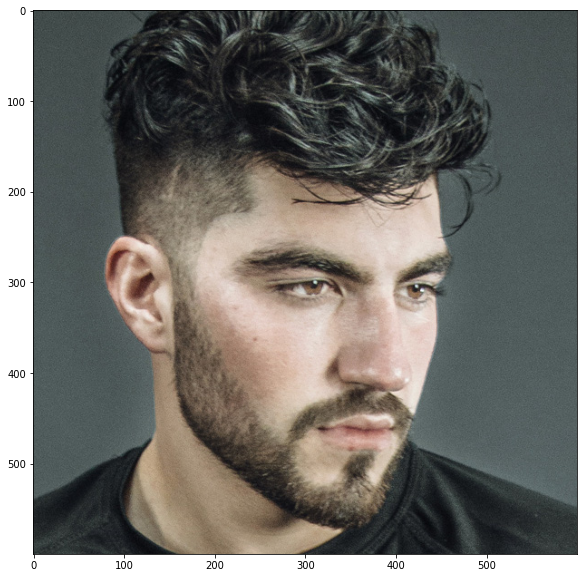

In [32]:
pho = cv2.imread('../input/real-and-fake-face-detection/real_and_fake_face/training_real/real_00008.jpg')
pho = cv2.cvtColor(pho, cv2.COLOR_BGR2RGB)
display_img(pho)

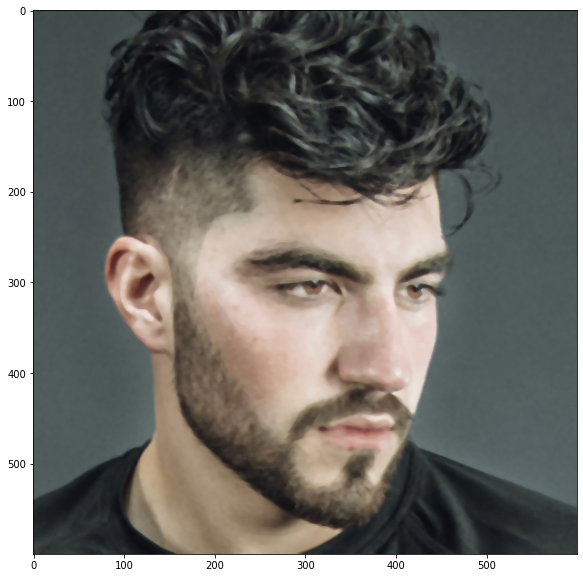

In [33]:
median = cv2.medianBlur(pho,5)
display_img(median)

# Bilateral Filtering

> #### A bilateral filter is used for smoothening images and reducing noise

>#### the bilateral filter adds a tonal weight such that pixel values that are close to the pixel value in the center are weighted more than pixel values that are more different.
This tonal weighting makes that the bilateral filter is capable of preserving edges (large differences in tonal value) while smoothing in the more flat regions (small tonal differences).

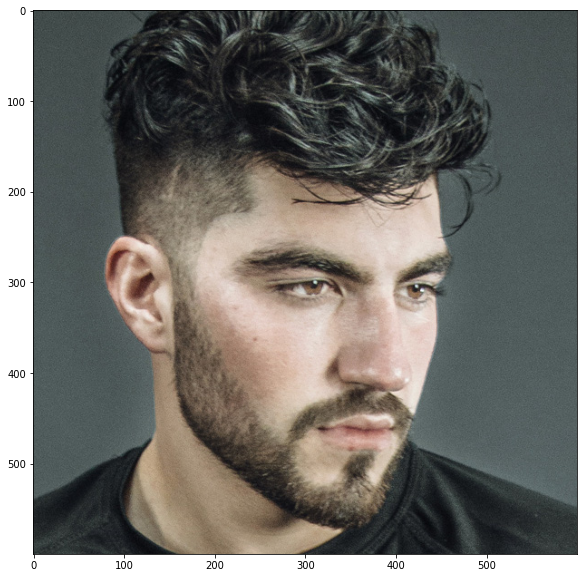

In [34]:
font = cv2.FONT_HERSHEY_COMPLEX
display_img(pho)

>#### the noise of the image is reduced

# Canny Edge Detection

> #### Canny edge detection is a technique to extract useful structural information from different vision objects and dramatically reduce the amount of data to be processed

> #### To satisfy these requirements Canny used the calculus of variations – a technique which finds the function which optimizes a given functional. The optimal function in Canny's detector is described by the sum of four exponential terms, but it can be approximated by the first derivative of a Gaussian.

>### Choosing Thresholds

In [35]:
med_val = np.median(pho) 
lower = int(max(0, 0.7* med_val))

In [36]:
upper = int(min(255,1.3 * med_val))

In [37]:
blurred_img = cv2.blur(pho,ksize=(5,5))

In [38]:
edges = cv2.Canny(image=blurred_img, threshold1=lower , threshold2=upper)

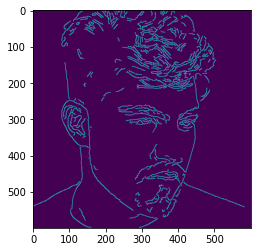

In [39]:
plt.imshow(edges)

> #### as we see it captures the edges of the photo as Canny edge detection algorithm is one of the most strictly defined methods that provides good and reliable detection.
> #### Owing to its optimality to meet with the three criteria for edge detection and the simplicity of process for implementation, it became one of the most popular algorithms for edge detection.